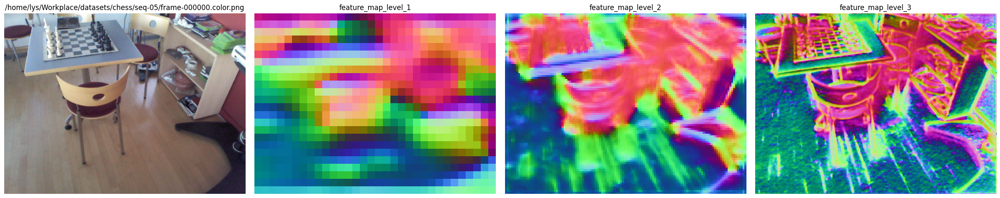

In [16]:
# 读取特定路径的图片提取特征图和不确定图并展示
import torch
import cv2
import numpy as np
import scipy.io as sio
import torch.nn.functional as F

from pixloc.pixlib.models import get_model
from pixloc.pixlib.datasets.view import read_image,resize,numpy_image_to_torch
from pixloc.visualization.viz_2d import (
    plot_images, plot_keypoints, add_text, features_to_RGB)
from pixloc.pixlib.datasets.view import resize


def prepare_input(image: np.array) -> torch.Tensor:
    return numpy_image_to_torch(image).unsqueeze(0)


# 模型搭建和配置加载
pretrain={
    'megadepth':'vgg19',
    'cmu':'vgg16',
}
extra='cmu'
model_name='two_view_refiner'

conf={  'name': 'two_view_refiner', 
        'extractor': {  'name': 'unet', 
                        'encoder': pretrain[extra], 
                        'decoder': [64, 64, 64, 32], 
                        'output_scales': [0, 2, 4], 
                        'output_dim': [32, 128, 128], 
                        'freeze_batch_normalization': False, 
                        'do_average_pooling': False, 
                        'compute_uncertainty': True, 
                        'checkpointed': True}, 
        'optimizer': {  'num_iters': 100, 
                        'pad': 2, 
                        'lambda_': 0.01, 
                        'verbose': False, 
                        'loss_fn': 
                        'scaled_barron(0, 0.1)', 
                        'no_conditions': True, 
                        'jacobi_scaling': False, 
                        'sqrt_diag_damping': False, 
                        'name': 'learned_optimizer', 
                        'bound_confidence': True, 
                        'learned_damping': True, 
                        'damping': {'type': 'constant'}}, 
                        'init_target_offset': None, 
                        'success_thresh': 3, 
                        'normalize_features': True, 
                        'duplicate_optimizer_per_scale': True}
ckpt='/home/lys/Workplace/python/pixloc/outputs/training/pixloc_'+extra+'/checkpoint_best.tar'
# ckpt='/home/lys/Workplace/python/pixloc/outputs/training/transunet3p_720/checkpoint_best.tar'
ckpt = torch.load(str(ckpt), map_location='cpu')
model = get_model(model_name)(conf).eval()
state_dict = ckpt['model']
dict_params = set(state_dict.keys())
model_params = set(map(lambda n: n[0], model.named_parameters()))
diff = model_params - dict_params
if len(diff) > 0:
    print("false")
model.load_state_dict(state_dict, strict=False) 

extractor=model.extractor

#--读取图片
# 905
# img_path='/home/lys/Workplace/datasets/jiawei_cheku/query/IMG_9977.JPG' 
# CMU
# img_path='/home/lys/Workplace/datasets/CMU/slice9/database/img_03236_c0_1303398755714165us.jpg'
# cheku
# img_path='/home/lys/Workplace/datasets/jiawei_cheku_dif_time/query_dif_time/IMG_6684.JPG'
# 车库diff
img_path='/home/lys/Workplace/datasets/chess/seq-05/frame-000000.color.png'
image_row=read_image(img_path)

#--归一化
scale_image=2
rez=1024
target_size = rez // scale_image

image = image_row.astype(np.float32)
image, scale_resize = resize(image, target_size, max, 'linear')
image_tensor = prepare_input(image)
pred = extractor({'image': image_tensor})

features = pred['feature_maps']
features = [feat.squeeze(0) for feat in features]
confidences = pred.get('confidences')
confidences = [c.squeeze(0) for c in confidences]

# cnn_features = pred['CNN_feature']
# cnn_features = [feat.squeeze(0) for feat in cnn_features]
# cnn_features = [f.cpu() for f in cnn_features]
# cnn_0 = features_to_RGB(cnn_features[0].detach().numpy())[0]
# cnn_1 = features_to_RGB(cnn_features[1].detach().numpy())[0]
# cnn_2 = features_to_RGB(cnn_features[2].detach().numpy())[0]
# cnn_3 = features_to_RGB(cnn_features[3].detach().numpy())[0]
# print(cnn_features[0].shape)
# print(cnn_features[1].shape)
# print(cnn_features[2].shape)
# print(cnn_features[3].shape)

features = [f.cpu() for f in features]
confidences=[w.cpu()[0] for w in confidences]
weights0=confidences[2].detach().numpy()
weights1=confidences[1].detach().numpy()
weights2=confidences[0].detach().numpy()

#-展示图片
features2 = features_to_RGB(features[0].detach().numpy())[0]
features1 = features_to_RGB(features[1].detach().numpy())[0]
features0 = features_to_RGB(features[2].detach().numpy())[0]
plot_images([image_row, features0,features1,features2], cmaps='turbo',
                titles=[img_path, 'feature_map_level_1','feature_map_level_2','feature_map_level_3' ], dpi=100)

In [10]:
# 读取图片并下采样
from PIL import Image
# img=cv2.imread("/home/lys/Workplace/datasets/yuqi/20220911_135752.JPG")
# img,_=resize(img, 512,max, interp='linear')
# cv2.imwrite("/home/lys/Workplace/datasets/yuqi/20220911_135752.JPG",img)
path="/home/lys/Workplace/datasets/chess/seq-05/frame-000000.color.png"
original_img = Image.open(path)
print(weights2.shape)

(384, 512)


In [5]:
# 读取边缘特征图
image_edge=cv2.imread("/home/lys/Workplace/datasets/jiawei_cheku_dif_time_outputs/query_dif_time_masks/mask_IMG_6684.JPG")
image_edge=image_edge[:,:,0]
image_edge.shape

(3024, 4032)

In [ ]:
# 抓换成浮点数->resize->归一化到[0,1]
image_edge = image_edge.astype(np.float32)
resize2=512
resize1=resize2//4
resize0=resize1//4
image_edge2,_=resize(image_edge, resize2,max, interp='linear')
image_edge1,_=resize(image_edge, resize1,max, interp='linear')
image_edge0,_=resize(image_edge, resize0,max, interp='linear')
image_edge2=image_edge2/255
image_edge1=image_edge1/255
image_edge0=image_edge0/255

In [ ]:
print(weights2.shape)
print(weights0)
print('总像素个数\t'+str(np.sum(weights0>=0)))
print('0->0.3\t\t'+str(np.sum(weights0>=0)-np.sum(weights0>0.3)))
print('0.3->0.5\t'+str(np.sum(weights0>0.3)-np.sum(weights0>0.5)))
print('0.5->0.8\t'+str(np.sum(weights0>0.5)-np.sum(weights0>0.8)))
print('0.8->1\t\t'+str(np.sum(weights0>0.8)))
print("----------------------------------------------------------------")
print(image_edge.shape)
print(image_edge)
print('总像素个数\t'+str(np.sum(image_edge>=0)))
print('0->0.3\t\t'+str(np.sum(image_edge>=0)-np.sum(image_edge>0.3)))
print('0.3->0.5\t'+str(np.sum(image_edge>0.3)-np.sum(image_edge>0.5)))
print('0.5->0.8\t'+str(np.sum(image_edge>0.5)-np.sum(image_edge>0.8)))
print('0.8->1\t\t'+str(np.sum(image_edge>0.8)))

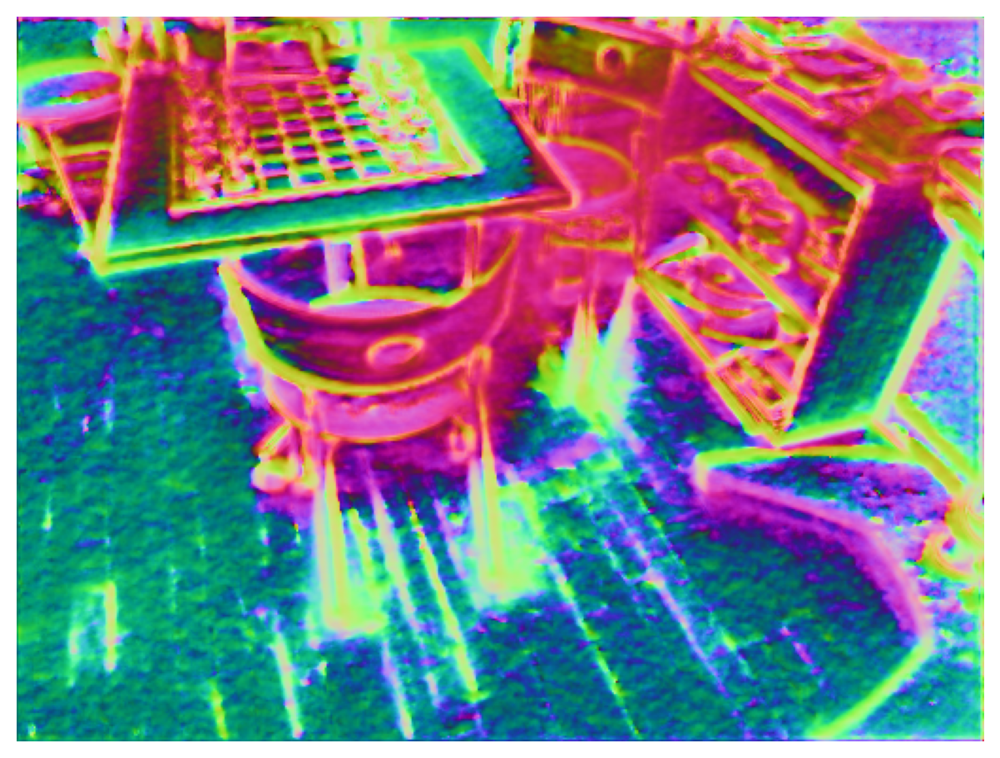

In [17]:
plot_images([features2], cmaps='turbo', dpi=200)

In [ ]:
tes=np.where(image_edge2>0.7,1,image_edge2)
plot_images([tes], cmaps='turbo',
                titles=['uncertainty_map_level_3'], dpi=200)

In [ ]:
plot_images([weights2], cmaps='turbo',
                titles=['img_uncertainty_map_level_3'], dpi=200)

In [ ]:
image_edge2=np.where(image_edge2>0.5,1,image_edge2)
# image_edge2=np.where(image_edge2>0.7,1,image_edge2)
image_edge=torch.tensor(image_edge2)
# image_edge=torch.where(image_edge>0.7,1,image_edge)
image_edge

In [ ]:
plot_images([new], cmaps='turbo',
                titles=['new_map_level_3'], dpi=200)

In [ ]:
final=np.where(weights0>image_edge0,weights0,image_edge0)
final

In [ ]:
plot_images([final], cmaps='turbo',
                titles=['img_uncertainty_map_level_3'], dpi=200)

In [ ]:
# 读取特征图并展示
print(features[0].shape)

# 读取数据并展示数据维度
part0=sio.loadmat("/home/lys/Workplace/datasets/yuqi/part0.mat")['feature']
part1=sio.loadmat("/home/lys/Workplace/datasets/yuqi/part1.mat")['feature']
part2=sio.loadmat("/home/lys/Workplace/datasets/yuqi/part2.mat")['feature']
part3=sio.loadmat("/home/lys/Workplace/datasets/yuqi/part3.mat")['feature']
print(part0.shape)

# array->tensor 并去掉最后一行和一列
part0=torch.Tensor(part0)[:,:-1,:-1]
part1=torch.Tensor(part1)[:,:-1,:-1]
part2=torch.Tensor(part2)[:,:-1,:-1]
part3=torch.Tensor(part3)[:,:-1,:-1]
print(part0.shape)

part00=features_to_RGB(part0.detach().numpy())[0]
part11=features_to_RGB(part1.detach().numpy())[0]
part22=features_to_RGB(part2.detach().numpy())[0]
part33=features_to_RGB(part3.detach().numpy())[0]
plot_images([part00, part11,part22,part33], cmaps='turbo',
                titles=[ 'part0','part1','part2','part3' ], dpi=100)

In [ ]:
# 第一种拼接方法连接处的分割痕迹很明显
final=torch.zeros(128,384,512)
final[:,0:320,0:480]=part0
final[:,320:,0:480]=part1[:,-64:,:]
final[:,0:320,480:]=part2[:,:,-32:]
final[:,320:,480:]=part3[:,-64:,-32:]

In [ ]:
# 如果边缘部分不处理，拼接部分一定会很明显
final=torch.zeros(128,384,512)
final[:,0:64,0:32]=part0[:,0:64,0:32]
final[:,64:,0:32]=part1[:,-320:,0:32]
final[:,0:64,32:]=part2[:,0:64,-480:]
final[:,-320:,-480:]=part3

In [ ]:
final=torch.zeros(128,384,512)
final[:,0:320,0:480]+=part0
final[:,64:,0:480]+=part1
final[:,0:320,32:]+=part2
final[:,64:,32:]+=part3
final[:,64:320,:]/=2
final[:,:32:480]/=2
print(final.shape)

In [ ]:
finall=features_to_RGB(final.detach().numpy())[0]
plot_images([finall], cmaps='turbo',
                titles=[ 'final'], dpi=200)

In [ ]:
print(features[0].shape)
print(final.shape)
test=torch.cat([features[0],final],0)
print(test.shape)
testl=features_to_RGB(test.detach().numpy())[0]
plot_images([testl], cmaps='turbo',
                titles=[ 'final'], dpi=200)

In [ ]:
# print(features[0].shape) # torch.Size([32, 384, 512])
# print(features[1].shape) # torch.Size([128, 96, 128])
# print(features[2].shape) # torch.Size([128, 24, 32])
edge_feature=np.load("/home/lys/Workplace/datasets/features/20220911_142716.npy")  # (128, 384, 512)
edge_feature_tensor=torch.Tensor(edge_feature)  # torch.Size([128, 384, 512])

edge2=torch.unsqueeze(edge_feature_tensor,0)          # torch.Size([1, 128, 384, 512])
edge1=F.interpolate(edge2,size=(96,128),mode='bilinear')  # torch.Size([1, 128, 96, 128])
edge0=F.interpolate(edge2,size=(24,32),mode='bilinear')   # torch.Size([1, 128, 24, 32])



edge2_show=torch.squeeze(edge2,0).detach().numpy()   # (128, 384, 512)
edge1_show=torch.squeeze(edge1,0).detach().numpy()   # (128, 96, 128)
edge0_show=torch.squeeze(edge0,0).detach().numpy()   # (128, 24, 32)
edge2_show=features_to_RGB(edge2_show)[0]
edge1_show=features_to_RGB(edge1_show)[0]
edge0_show=features_to_RGB(edge0_show)[0]

merge0=torch.cat([torch.squeeze(edge0,0),features[2]],0) # torch.Size([256, 24, 32])
merge1=torch.cat([torch.squeeze(edge1,0),features[1]],0) # torch.Size([256, 96, 128])
merge2=torch.cat([torch.squeeze(edge2,0),features[0]],0) # torch.Size([160, 384, 512])

merge0_show=features_to_RGB(merge0.detach().numpy())[0]
merge1_show=features_to_RGB(merge1.detach().numpy())[0]
merge2_show=features_to_RGB(merge2.detach().numpy())[0]

plot_images([features0,features1,features2], cmaps='turbo',
                titles=['feature_map_32','feature_map_128','feature_map_128' ], dpi=100)
plot_images([edge0_show,edge1_show,edge2_show], cmaps='turbo',
                titles=['edge0_128','edge1_128' ,'edge_128'], dpi=100)

plot_images([merge0_show,merge1_show,merge2_show], cmaps='turbo',
                titles=['merge0_160','merge1_256','merge2_256' ], dpi=100)

In [ ]:
# 车辆mask实验
import torch
import cv2
import numpy as np
import scipy.io as sio
import torch.nn.functional as F

from pixloc.pixlib.models import get_model
from pixloc.pixlib.datasets.view import read_image,resize,numpy_image_to_torch
from pixloc.visualization.viz_2d import (
    plot_images, plot_keypoints, add_text, features_to_RGB)
from pixloc.pixlib.datasets.view import resize

def prepare_input(image: np.array) -> torch.Tensor:
    return numpy_image_to_torch(image).unsqueeze(0)


# 模型搭建和配置加载
pretrain={
    'megadepth':'vgg19',
    'cmu':'vgg16',
}
extra='cmu'
model_name='two_view_refiner'

conf={  'name': 'two_view_refiner', 
        'extractor': {  'name': 'unet', 
                        'encoder': pretrain[extra], 
                        'decoder': [64, 64, 64, 32], 
                        'output_scales': [0, 2, 4], 
                        'output_dim': [32, 128, 128], 
                        'freeze_batch_normalization': False, 
                        'do_average_pooling': False, 
                        'compute_uncertainty': True, 
                        'checkpointed': True}, 
        'optimizer': {  'num_iters': 100, 
                        'pad': 2, 
                        'lambda_': 0.01, 
                        'verbose': False, 
                        'loss_fn': 
                        'scaled_barron(0, 0.1)', 
                        'no_conditions': True, 
                        'jacobi_scaling': False, 
                        'sqrt_diag_damping': False, 
                        'name': 'learned_optimizer', 
                        'bound_confidence': True, 
                        'learned_damping': True, 
                        'damping': {'type': 'constant'}}, 
                        'init_target_offset': None, 
                        'success_thresh': 3, 
                        'normalize_features': True, 
                        'duplicate_optimizer_per_scale': True}
ckpt='/home/lys/Workplace/python/pixloc/outputs/training/pixloc_'+extra+'/checkpoint_best.tar'
# ckpt='/home/lys/Workplace/python/pixloc/outputs/training/swin_unet_2262/checkpoint_best.tar'
ckpt = torch.load(str(ckpt), map_location='cpu')
model = get_model(model_name)(conf).eval()
state_dict = ckpt['model']
dict_params = set(state_dict.keys())
model_params = set(map(lambda n: n[0], model.named_parameters()))
diff = model_params - dict_params
if len(diff) > 0:
    print("false")
model.load_state_dict(state_dict, strict=False) 

extractor=model.extractor

#--读取图片
# 905
# img_path='/home/lys/Workplace/datasets/jiawei_cheku/query/IMG_9977.JPG' 
# CMU
# img_path='/home/lys/Workplace/datasets/CMU/slice9/database/img_03236_c0_1303398755714165us.jpg'
# cheku
img_path='/home/lys/Workplace/datasets/test/aic论文/IMG_6792.JPG'
# img_path='/home/lys/Workplace/datasets/jiawei_cheku_dif_time/db/20220911_143557.JPG'
img_path='/home/lys/Workplace/datasets/科技楼/地面/DJI_0269.JPG'
image_row=read_image(img_path)

#--归一化
scale_image=2
rez=1024
target_size = rez // scale_image

image = image_row.astype(np.float32)
image, scale_resize = resize(image, target_size, max, 'linear')
image_tensor = prepare_input(image)
pred = extractor({'image': image_tensor})

features = pred['feature_maps']
features = [feat.squeeze(0) for feat in features]
confidences = pred.get('confidences')
confidences = [c.squeeze(0) for c in confidences]

# cnn_features = pred['CNN_feature']
# cnn_features = [feat.squeeze(0) for feat in cnn_features]
# cnn_features = [f.cpu() for f in cnn_features]
# cnn_0 = features_to_RGB(cnn_features[0].detach().numpy())[0]
# cnn_1 = features_to_RGB(cnn_features[2].detach().numpy())[0]
# cnn_2 = features_to_RGB(cnn_features[4].detach().numpy())[0]

features = [f.cpu() for f in features]
confidences=[w.cpu()[0] for w in confidences]
weights0=confidences[2].detach().numpy()
weights1=confidences[1].detach().numpy()
weights2=confidences[0].detach().numpy()

#-展示图片
features2 = features_to_RGB(features[0].detach().numpy())[0]
features1 = features_to_RGB(features[1].detach().numpy())[0]
features0 = features_to_RGB(features[2].detach().numpy())[0]
plot_images([image_row, features0,features1,features2], cmaps='turbo',
                titles=[img_path, 'feature_map_level_1','feature_map_level_2','feature_map_level_3' ], dpi=100)
plot_images([image_row, weights0,weights1,weights2], cmaps='turbo',
                titles=[img_path, 'uncertainty_map_level_1','uncertainty_map_level_2','uncertainty_map_level_3' ], dpi=100)
# plot_images([image_row, cnn_2,cnn_1,cnn_0], cmaps='turbo',
#                 titles=[img_path, 'uncertainty_map_level_1','uncertainty_map_level_2','uncertainty_map_level_3' ], dpi=100)

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

/home/lys/Workplace/python/pixloc/pixloc/visualization/viz_2d.py:56: UserWarning: Glyph 31185 (\N{CJK UNIFIED IDEOGRAPH-79D1}) missing from current font.
  fig.tight_layout(pad=pad)
/home/lys/Workplace/python/pixloc/pixloc/visualization/viz_2d.py:56: UserWarning: Glyph 25216 (\N{CJK UNIFIED IDEOGRAPH-6280}) missing from current font.
  fig.tight_layout(pad=pad)
/home/lys/Workplace/python/pixloc/pixloc/visualization/viz_2d.py:56: UserWarning: Glyph 27004 (\N{CJK UNIFIED IDEOGRAPH-697C}) missing from current font.
  fig.tight_layout(pad=pad)
/home/lys/Workplace/python/pixloc/pixloc/visualization/viz_2d.py:56: UserWarning: Glyph 22320 (\N{CJK UNIFIED IDEOGRAPH-5730}) missing from current font.
  fig.tight_layout(pad=pad)
/home/lys/Workplace/python/pixloc/pixloc/visualization/viz_2d.py:56: UserWarning: Glyph 38754 (\N{CJK UNIFIED IDEOGRAPH-9762}) missing from current font.
  fig.tight_layout(pad=pad)
/home/lys/anaconda3/envs/pixloc/lib/python3.8/site-packages/IPython/core/pylabtools.py:151

In [47]:
# 读取掩码
imgMask=cv2.imread("/home/lys/Workplace/datasets/test/mask_IMG_5279.JPG")
imgMask=imgMask[:,:,0]
imgMask.shape #(3024, 4032)->(384, 512)

(3024, 4032)

In [48]:
# 抓换成浮点数->resize->归一化到[0,1]
# imgMask = imgMask.astype(np.float32)
resize2=512
resize1=resize2//4
resize0=resize1//4
imgMask2,_=resize(imgMask, resize2,max, interp='linear')
imgMask1,_=resize(imgMask, resize1,max, interp='linear')
imgMask0,_=resize(imgMask, resize0,max, interp='linear')
imgMask2=imgMask2/255
imgMask1=imgMask1/255
imgMask0=imgMask0/255
imgMask2.shape

(384, 512)

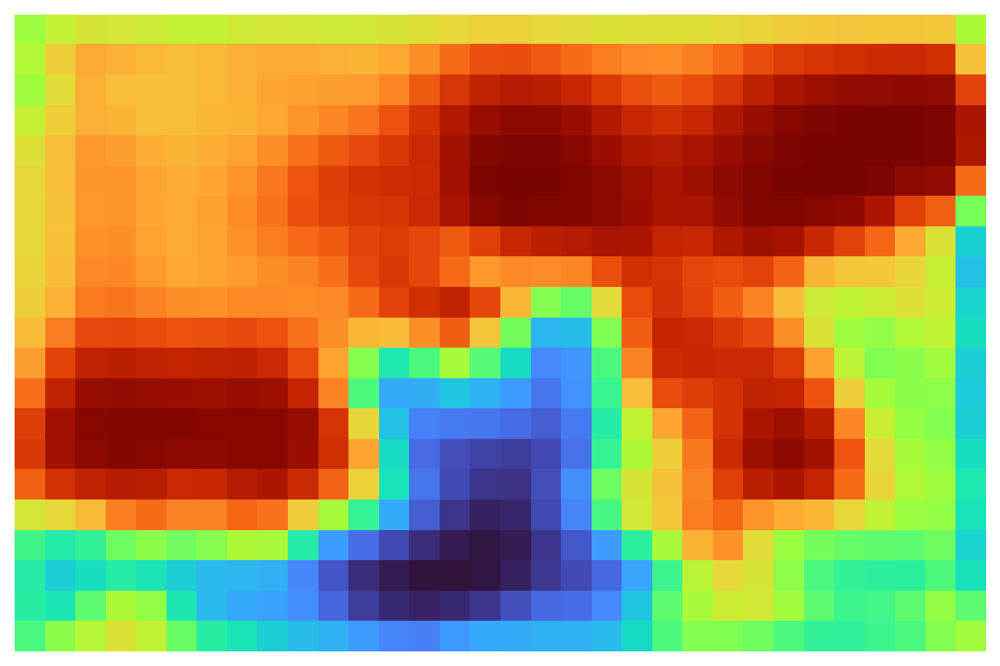

In [8]:
plot_images([weights0], cmaps='turbo', dpi=200)

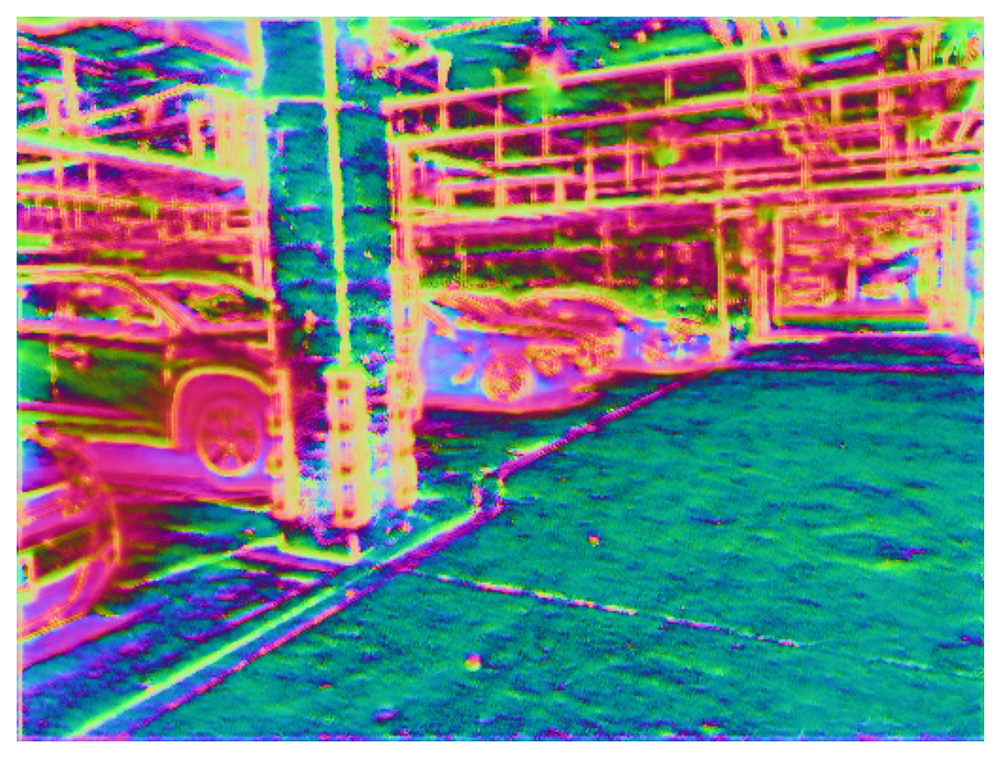

In [6]:
plot_images([features2], cmaps='turbo', dpi=200)

In [49]:
img_merge_mask2=np.where(imgMask2==1,0,weights2)
img_merge_mask1=np.where(imgMask1==1,0,weights1)
img_merge_mask0=np.where(imgMask0==1,0,weights0)

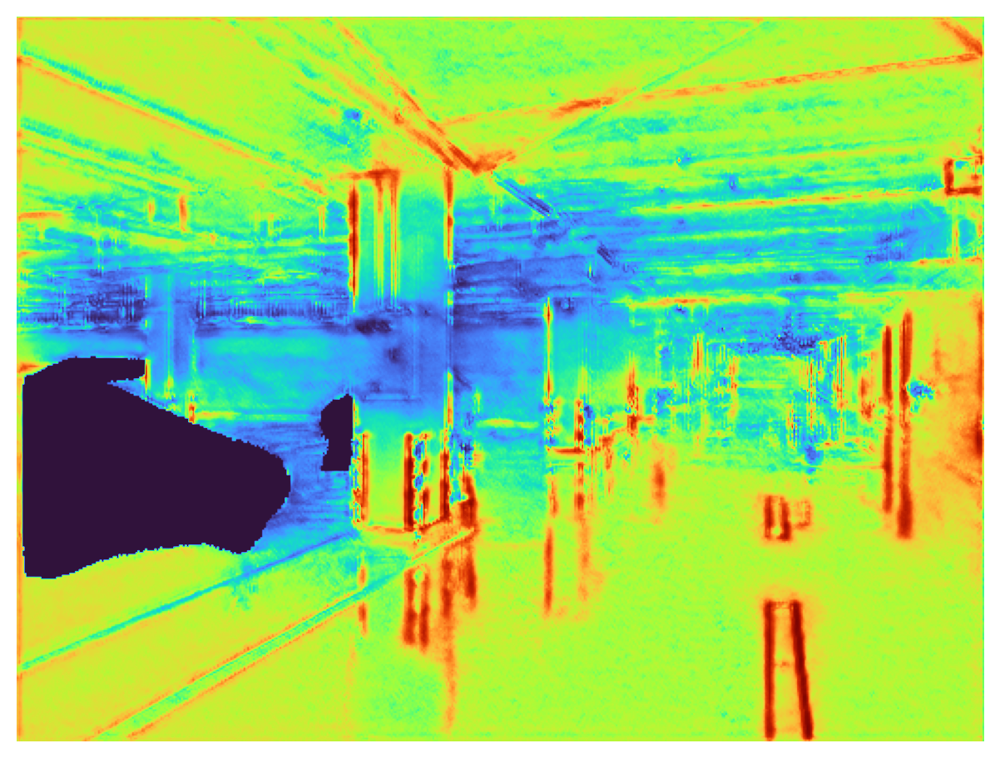

In [50]:
plot_images([img_merge_mask2], cmaps='turbo', dpi=200)

In [25]:
pp=img_merge_mask2*255
cv2.imwrite('1.png',pp)

True

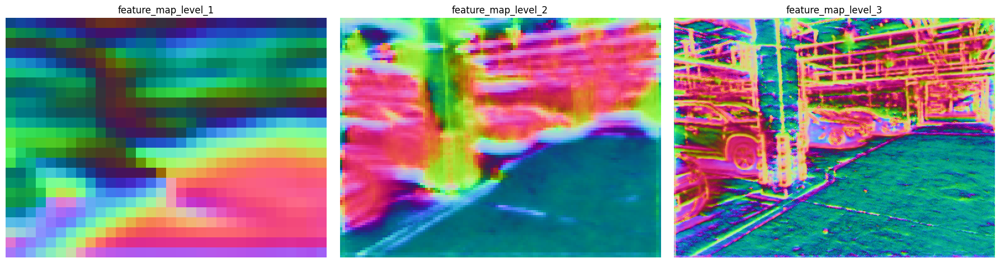

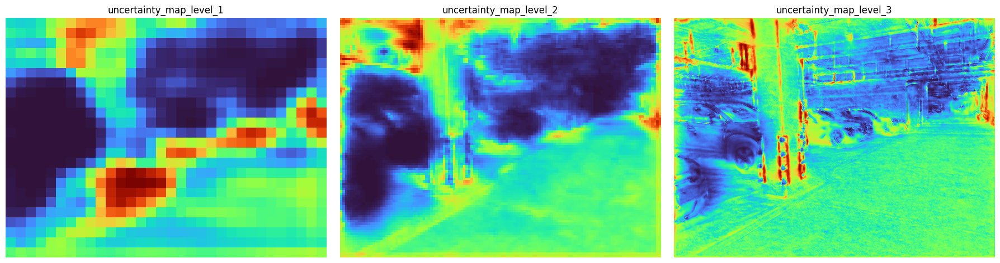

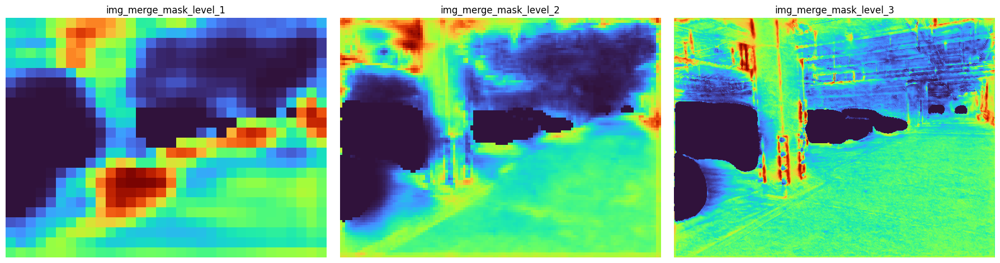

In [10]:
plot_images([features0,features1,features2], cmaps='turbo',
                titles=['feature_map_level_1','feature_map_level_2','feature_map_level_3' ], dpi=100)
plot_images([weights0,weights1,weights2], cmaps='turbo',
                titles=['uncertainty_map_level_1','uncertainty_map_level_2','uncertainty_map_level_3' ], dpi=100)
plot_images([img_merge_mask0,img_merge_mask1,img_merge_mask2], cmaps='turbo',
                titles=['img_merge_mask_level_1','img_merge_mask_level_2','img_merge_mask_level_3' ], dpi=100)

torch.Size([1, 24, 32]) torch.Size([1, 96, 128]) torch.Size([1, 384, 512])
torch.Size([1, 24, 32]) torch.Size([1, 96, 128]) torch.Size([1, 384, 512])
torch.Size([1, 24, 32]) torch.Size([1, 96, 128]) torch.Size([1, 384, 512])
(24, 32) (96, 128) (384, 512)


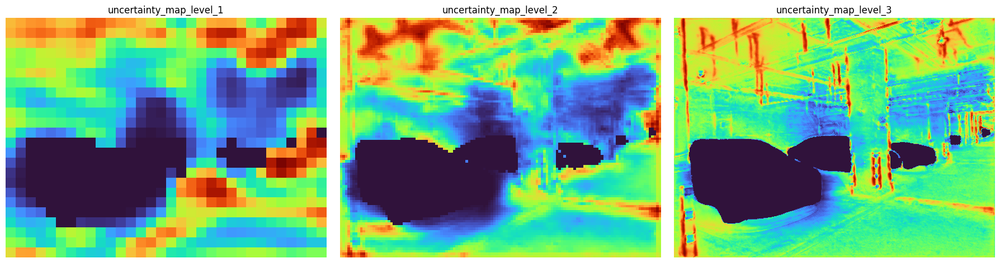

In [53]:
pp=pred.get('confidences')
pp=[w.squeeze(0) for w in pp]
weight0=pp[2]
weight1=pp[1]
weight2=pp[0]
print(weight0.shape,weight1.shape,weight2.shape)
imgMask=cv2.imread("/home/lys/Workplace/datasets/jiawei_cheku_dif_time_outputs/query_dif_time_masks/mask_IMG_6684.JPG")
imgMask=imgMask[:,:,0]
imgMask = imgMask.astype(np.float32)
resize2=512
resize1=resize2//4
resize0=resize1//4
imgMask2,_=resize(imgMask, resize2,max, interp='linear')
imgMask1,_=resize(imgMask, resize1,max, interp='linear')
imgMask0,_=resize(imgMask, resize0,max, interp='linear')
imgMask2=imgMask2/255
imgMask1=imgMask1/255
imgMask0=imgMask0/255
imgMask2=torch.tensor(imgMask2)
imgMask1=torch.tensor(imgMask1)
imgMask0=torch.tensor(imgMask0)
imgMask2=imgMask2.unsqueeze(0)
imgMask1=imgMask1.unsqueeze(0)
imgMask0=imgMask0.unsqueeze(0)
print(imgMask0.shape,imgMask1.shape,imgMask2.shape)
tem=torch.tensor(0, device='cpu', dtype=torch.float32)
weights2=torch.where(imgMask2==1,tem,weight2)
weights1=torch.where(imgMask1==1,tem,weight1)
weights0=torch.where(imgMask0==1,tem,weight0)
print(weights0.shape,weights1.shape,weights2.shape)
weights2=weights2[0].detach().numpy()
weights1=weights1[0].detach().numpy()
weights0=weights0[0].detach().numpy()
print(weights0.shape,weights1.shape,weights2.shape)
plot_images([weights0,weights1,weights2], cmaps='turbo',
                titles=['uncertainty_map_level_1','uncertainty_map_level_2','uncertainty_map_level_3' ], dpi=100)

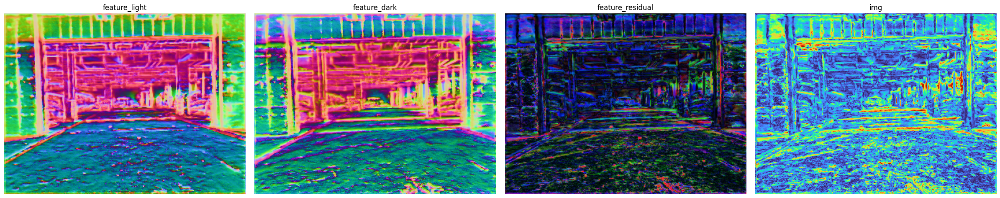

In [52]:
# 读取特定路径的图片提取特征图和不确定图并展示
import torch
import cv2
import numpy as np
import scipy.io as sio
import torch.nn.functional as F
import math

from pixloc.pixlib.models import get_model
from pixloc.pixlib.datasets.view import read_image,resize,numpy_image_to_torch
from pixloc.visualization.viz_2d import (
    plot_images, plot_keypoints, add_text, features_to_RGB)
from pixloc.pixlib.datasets.view import resize


def prepare_input(image: np.array) -> torch.Tensor:
    return numpy_image_to_torch(image).unsqueeze(0)


# 模型搭建和配置加载
pretrain={
    'megadepth':'vgg19',
    'cmu':'vgg16',
}
extra='cmu'
model_name='two_view_refiner'

conf={  'name': 'two_view_refiner', 
        'extractor': {  'name': 'unet', 
                        'encoder': pretrain[extra], 
                        'decoder': [64, 64, 64, 32], 
                        'output_scales': [0, 2, 4], 
                        'output_dim': [32, 128, 128], 
                        'freeze_batch_normalization': False, 
                        'do_average_pooling': False, 
                        'compute_uncertainty': True, 
                        'checkpointed': True}, 
        'optimizer': {  'num_iters': 100, 
                        'pad': 2, 
                        'lambda_': 0.01, 
                        'verbose': False, 
                        'loss_fn': 
                        'scaled_barron(0, 0.1)', 
                        'no_conditions': True, 
                        'jacobi_scaling': False, 
                        'sqrt_diag_damping': False, 
                        'name': 'learned_optimizer', 
                        'bound_confidence': True, 
                        'learned_damping': True, 
                        'damping': {'type': 'constant'}}, 
                        'init_target_offset': None, 
                        'success_thresh': 3, 
                        'normalize_features': True, 
                        'duplicate_optimizer_per_scale': True}
ckpt='/home/lys/Workplace/python/pixloc/outputs/training/pixloc_'+extra+'/checkpoint_best.tar'
ckpt = torch.load(str(ckpt), map_location='cpu')
model = get_model(model_name)(conf).eval()
state_dict = ckpt['model']
dict_params = set(state_dict.keys())
model_params = set(map(lambda n: n[0], model.named_parameters()))
diff = model_params - dict_params
if len(diff) > 0:
    print("false")
model.load_state_dict(state_dict, strict=False) 

extractor=model.extractor

#--读取图片
img_light='/home/lys/Workplace/datasets/test/light.jpg'
img_dark='/home/lys/Workplace/datasets/test/dark.jpg'
image_light=read_image(img_light)
image_dark=read_image(img_dark)

#--归一化
scale_image=2
rez=1024
target_size = rez // scale_image

image_light = image_light.astype(np.float32)
image_dark = image_dark.astype(np.float32)
image_light, scale_resize = resize(image_light, target_size, max, 'linear')
image_dark, scale_resize = resize(image_dark, target_size, max, 'linear')

image_light = prepare_input(image_light)
image_dark = prepare_input(image_dark)

pred_l = extractor({'image': image_light})
pred_d = extractor({'image': image_dark})

features_l = pred_l['feature_maps']
features_d = pred_d['feature_maps']

features_squeeze_l = [features_l[0].squeeze(0)]
features_squeeze_d = [features_d[0].squeeze(0)]


features_final_l = [f.cpu() for f in features_squeeze_l]
features_final_d = [f.cpu() for f in features_squeeze_d]

# feature_residual=[l-d for l,d in zip(features_squeeze_l,features_squeeze_d)]
# featurer=features_to_RGB(feature_residual[0].detach().numpy())[0]

#-展示图片
featuresl = features_to_RGB(features_final_l[0].detach().numpy())[0]
featuresd = features_to_RGB(features_final_d[0].detach().numpy())[0]
# featurer=features_to_RGB(feature_residual[0].detach().numpy())[0]
featuresr = np.abs(featuresl-featuresd)
img = cv2.cvtColor(featuresr, cv2.COLOR_RGB2GRAY)

plot_images([featuresl,featuresd,featuresr,img], cmaps='turbo',
                titles=['feature_light','feature_dark','feature_residual','img'], dpi=100)

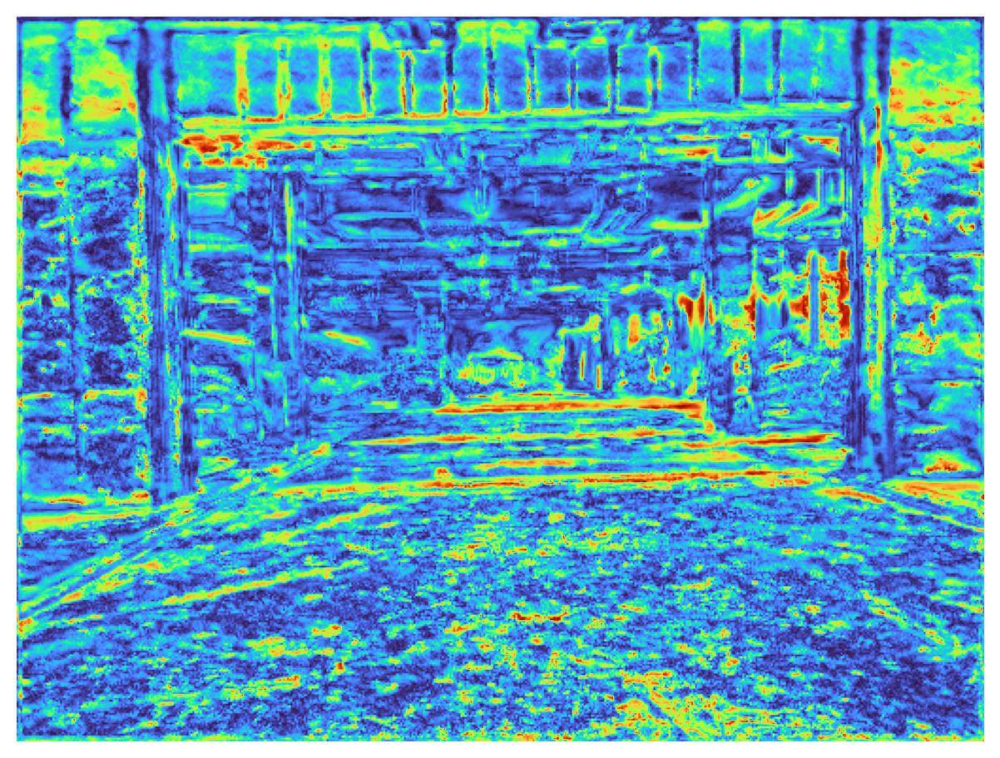

In [53]:
plot_images([img], cmaps='turbo', dpi=200)

In [9]:
#--
import cv2
image=cv2.imread('/home/lys/Workplace/datasets/kejilou/query/DJI_0259.JPG')
resized_image = cv2.resize(image, ( 3648,2736))
cv2.imwrite('/home/lys/Workplace/datasets/test/kejilou/resized_image2.jpg', resized_image)

#--

True

In [ ]:
import cv2 as cv

# 读取图像
big = cv.imread("/home/lys/Workplace/datasets/test/kejilou/resized_image.jpg")
small = cv.imread("/home/lys/Workplace/datasets/test/kejilou/resized_image2.jpg")

# 调整图像大小
scaled_big = cv.resize(big, (640,480))  
scaled_small = cv.resize(small, (640,480))  

# 创建SIFT特征检测器
sift = cv.SIFT_create()

# 特征点提取与描述子生成
kp1, des1 = sift.detectAndCompute(scaled_big, None)
kp2, des2 = sift.detectAndCompute(scaled_small, None)

# 暴力匹配
bf = cv.DescriptorMatcher_create(cv.DescriptorMatcher_BRUTEFORCE)
matches = bf.match(des1, des2)

# 绘制最佳匹配
matches = sorted(matches, key=lambda x: x.distance)
result = cv.drawMatches(scaled_big, kp1, scaled_small, kp2, matches[:15], None)

# 显示结果
cv.imshow("Match", result)
cv.waitKey(0)
cv.destroyAllWindows()